In [4]:
import folium
import geopandas as gpd
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib import rc
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.optimize import least_squares

rc('text', usetex=True)
plt.rcParams.update({'font.size': 18})
%matplotlib inline

In [5]:
# Reading file
file = open("../results/daily_cases.csv").readlines()
file = list(map(lambda x: x.split(";"), file))

file_qua = open("../results/daily_cases_in_quarantine.csv").readlines()
file_qua = list(map(lambda x: x.split(";"), file_qua))

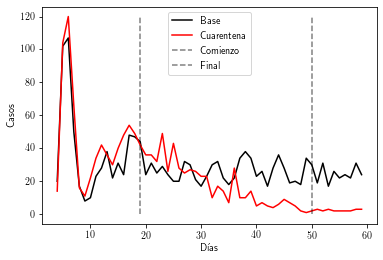

In [6]:
# Per day plot
def generate_cases(file):
    days_cases = {}
    for i in range(1, len(file)):
        line = file[i]
        if int(line[0]) in days_cases:
            days_cases[int(line[0])] += 1
        else:
            days_cases[int(line[0])] = 1
    return days_cases

days_cases = generate_cases(file)
days_cases_qua = generate_cases(file_qua)

# Plotting
days = list(days_cases.keys())
cases = list(days_cases.values())
days_qua = list(days_cases_qua.keys())
cases_qua = list(days_cases_qua.values())

plt.plot(days, cases, 'k', label='Base')
plt.plot(days_qua, cases_qua, 'r', label='Cuarentena')
plt.plot([19, 19], [0, 120], 'k--', alpha=0.5, label='Comienzo')
plt.plot([50, 50], [0, 120], 'k--', alpha=0.5, label='Final')
plt.legend()
plt.xlabel("Días")
plt.ylabel("Casos")
plt.savefig("../results/curva-ep.pdf", bbox_inches='tight')
plt.show()

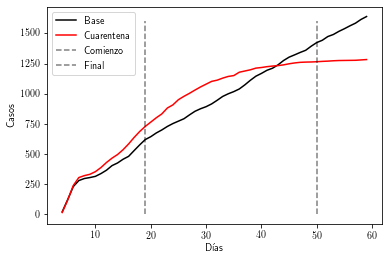

In [7]:
def generate_acum(cases):
    acum = [cases[0]]
    for i in range(1, len(cases)):
        acum.append(acum[i - 1] + cases[i])
    return acum

acum = generate_acum(cases)
acum_qua = generate_acum(cases_qua)

# Plotting
plt.plot(days, acum, 'k', label='Base')
plt.plot(days_qua, acum_qua, 'r', label='Cuarentena')
plt.plot([19, 19], [0, 1600], 'k--', alpha=0.5, label='Comienzo')
plt.plot([50, 50], [0, 1600], 'k--', alpha=0.5, label='Final')
plt.legend()
plt.xlabel("Días")
plt.ylabel("Casos")
plt.savefig("../acumulada.pdf", bbox_inches='tight')
plt.show()

In [8]:
# Read cases per zone
def generate_zone_cases(file):
    zones = {}
    for line in file[1:]:
        line_we = int(line[1].replace("\n", ""))
        if line_we in zones:
            zones[line_we] += 1
        else:
            zones[line_we] = 1
    return zones

zones = generate_zone_cases(file)
zones_qua = generate_zone_cases(file_qua)

In [9]:
# Create new geopandas data frame
urban_zones = gpd.read_file("maps/EOD.shp")

def generate_df(urban_zones, zones):
    new_df = []
    for _, rows in urban_zones.iterrows():
        id_sit = int(rows['SIT_2017'])
        if id_sit not in zones:
            zones[id_sit] = 0
        new_df.append({'geometry' : rows['geometry'], 'sit': id_sit, 'cases': zones[id_sit]})

    return gpd.GeoDataFrame(new_df)

gdf = generate_df(urban_zones, zones)
gdf_qua = generate_df(urban_zones, zones_qua)

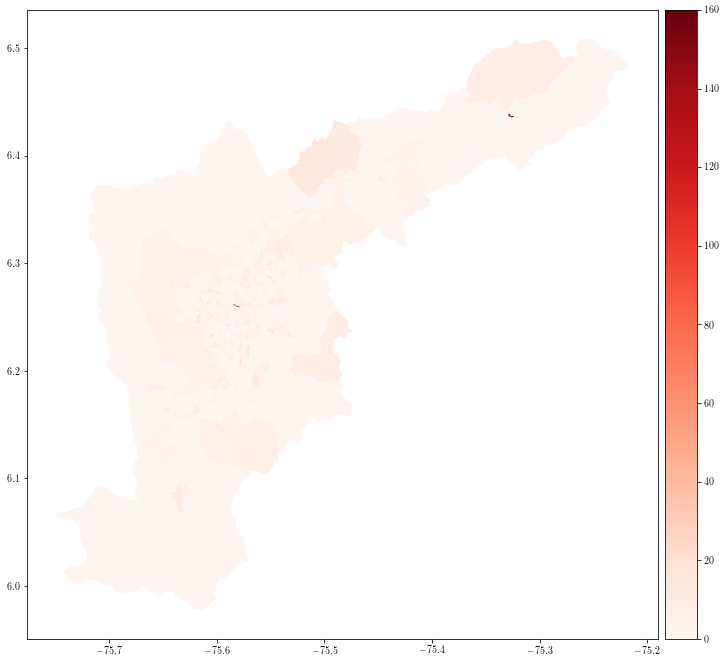

In [11]:
_, ax = plt.subplots(1, 1, figsize=(12, 12))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

gdf.plot(column='cases', ax=ax, legend=True, cmap='Reds', cax=cax)
plt.savefig("../results/choroplet.pdf", bbox_inches='tight')
plt.show()

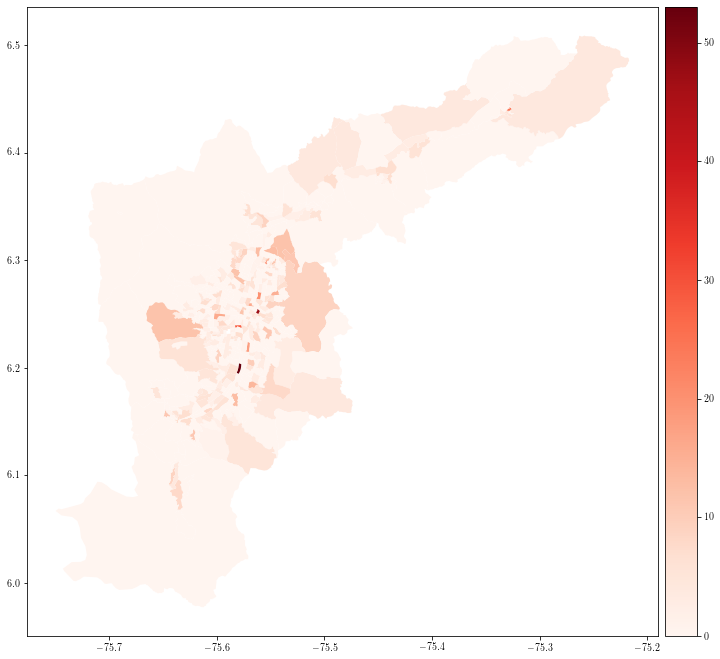

In [12]:
_, ax = plt.subplots(1, 1, figsize=(12, 12))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

gdf_qua.plot(column='cases', ax=ax, legend=True, cmap='Reds', cax=cax)
plt.savefig("../results/choroplet-quarantine.pdf", bbox_inches='tight')
plt.show()

# Folium Attempt

In [13]:
# Create csv file
csv = open("dcf.csv", "w")
csv.write("Zone,Cases\n")
for zone in zones:
    csv.write(str(zone) + "," + str(zones[zone]) + "\n")
csv.close()

# Create json file
json_file = open("maps/eod.json", "w")
json_file.write(gdf.to_json())
json_file.close()

In [14]:
# Data reading
geojson = "maps/eod.json"
cases = 'dcf.csv'
csv_file = pd.read_csv(cases)

# Folium rendering
m = folium.Map(location=[6.2696021,-75.6065468], zoom_start=10)

folium.Choropleth(
    geo_data=geojson,
    data=csv_file,
    name='choropleth',
    columns=['Zone', 'Cases'],
    key_on='feature.properties.sit',
    fill_color='Reds',
    line_opacity=0.2,
    fill_opacity=0.9,
    legend_name='COVID-19 Cases'
).add_to(m)

m